In [1]:
pip install altair

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install wbgapi

Note: you may need to restart the kernel to use updated packages.


### Usaremos la data de fallecidos, positivos y vacunados de covid19 extraída de Google data search. Importamos los paquetes y las bases de datos, las mergeamos, limpiamos la base y hacemos los gráficos.

In [3]:
import os
import csv
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import shapefile as shp
import unidecode as udc
import altair as alt
import wbgapi as wb

In [4]:
os.chdir("C:/Users/Usuario/Documents/2021-1 the last/python")

positivos = pd.read_csv("positivos_covid.csv", sep = ";")
vacunados = pd.read_csv("vacunas_covid.csv")
poblacion = pd.read_csv("PoblacionREDATAM.csv", encoding = "latin1", 
                        thousands = " ")
poblacion = poblacion.drop(["Código.1", "Unnamed: 122"], axis = 1)

poblacion = poblacion.rename({"Código": "Codigo", "Departamento ": "Departamento"}, axis = 1)

positivos.shape, vacunados.shape, poblacion.shape

((1925289, 9), (3278071, 12), (1879, 121))

In [5]:
positivos.isnull().sum(axis = 0)


FECHA_CORTE           0
UUID                  0
DEPARTAMENTO          0
PROVINCIA             0
DISTRITO              0
METODODX              0
EDAD                344
SEXO                  1
FECHA_RESULTADO    2023
dtype: int64

In [6]:
vacunados.isnull().sum(axis = 0)

FECHA_CORTE              0
UUID                     0
GRUPO_RIESGO             0
EDAD                132366
SEXO                     0
FECHA_VACUNACION         0
DOSIS                    0
FABRICANTE               0
DIRESA                   0
DEPARTAMENTO             0
PROVINCIA                0
DISTRITO                 0
dtype: int64

In [7]:
poblacion.isnull().sum(axis = 0)

Codigo           4
POBLACION        4
Departamento     5
Provincia        5
Distrito         5
                ..
Edad 111 años    4
Edad 112 años    4
Edad 113 años    4
Edad 114 años    4
Edad 115 años    4
Length: 121, dtype: int64

In [8]:
poblacion[["Codigo", "Departamento", "Provincia", "Distrito"]].tail().isnull()

poblacion["Codigo"].tail()

poblacion = poblacion[:1874]

poblacion.shape

(1874, 121)

In [9]:
def codaddzero(cod):
    if len(cod) < 6:
        return '0' + cod
    else:
        return cod

poblacion['Codigo'] = poblacion.apply(lambda row: codaddzero(row.Codigo), 
                                      axis = 1)

In [10]:
positivos.dtypes

FECHA_CORTE          int64
UUID                object
DEPARTAMENTO        object
PROVINCIA           object
DISTRITO            object
METODODX            object
EDAD               float64
SEXO                object
FECHA_RESULTADO    float64
dtype: object

In [11]:
vacunados.dtypes

FECHA_CORTE           int64
UUID                 object
GRUPO_RIESGO         object
EDAD                float64
SEXO                 object
FECHA_VACUNACION      int64
DOSIS                 int64
FABRICANTE           object
DIRESA               object
DEPARTAMENTO         object
PROVINCIA            object
DISTRITO             object
dtype: object

In [12]:
poblacion.dtypes

Codigo            object
POBLACION        float64
Departamento      object
Provincia         object
Distrito          object
                  ...   
Edad 111 años    float64
Edad 112 años    float64
Edad 113 años    float64
Edad 114 años    float64
Edad 115 años    float64
Length: 121, dtype: object

In [13]:
positivos = positivos.dropna()
vacunados = vacunados.dropna()

positivos["FECHA_RESULTADO"] = positivos["FECHA_RESULTADO"].astype(int).astype(str)
positivos["FECHA"] = pd.to_datetime(positivos["FECHA_RESULTADO"], 
                                              format = "%Y%m%d",
                                              errors = "coerce")

vacunados["FECHA_VACUNACION"] = vacunados["FECHA_VACUNACION"].astype(int).astype(str)
vacunados["FECHA"] = pd.to_datetime(vacunados["FECHA_VACUNACION"], 
                                              format = "%Y%m%d",
                                              errors = "coerce")

posi = positivos[["DEPARTAMENTO", "PROVINCIA", "DISTRITO", "METODODX", "EDAD", "SEXO", "FECHA"]]
vax = vacunados[["GRUPO_RIESGO", "EDAD", "SEXO", "FECHA", "DOSIS", "FABRICANTE", "DEPARTAMENTO", "PROVINCIA", "DISTRITO"]]

def grupo_edad(edad):
    if (edad < 11):
        return "10 a menos"
    elif (edad < 21):
        return "11-20"
    elif (edad < 31):
        return "21-30"
    elif (edad < 41):
        return "31-40"
    elif (edad < 51):
        return "41-50"
    elif (edad < 61):
        return "51-60"
    elif (edad < 71):
        return "61-70"
    elif (edad < 81):
        return "71-80"
    elif (edad < 91):
        return "81-90"
    elif (edad < 101):
        return "91-100"
    elif (edad >= 101):
        return "Mayor de 100"

posi["GRUPO_EDAD"] = posi.apply(lambda x : grupo_edad(x["EDAD"]), axis = 1)
vax["GRUPO_EDAD"] = vax.apply(lambda x : grupo_edad(x["EDAD"]), axis = 1)


poblacion["Total 10 a menos"] = poblacion.iloc[:,5:16].apply(lambda x : sum(x), axis = 1)

for i in list(np.linspace(10, 90, 9)):
    poblacion["Total " + str(int(i)+1) + "-" + str(int(i)+10)] = poblacion.iloc[:,int(i)+6:int(i)+16].apply(lambda x : sum(x), axis = 1)

poblacion["Total mayor de 100"] = poblacion.iloc[:,106:121].apply(lambda x : sum(x), axis = 1)

pob = poblacion.iloc[:,[0, 1, 2, 3, 4] + list(np.linspace(-11,-1,11))]

posi1 = pd.get_dummies(posi, columns = ["METODODX", "SEXO", "GRUPO_EDAD"], 
                       prefix = {'SEXO': '', 'METODODX': '', 'GRUPO_EDAD': 'POSI_EDAD_'}, 
                       prefix_sep = '')
vax1 = pd.get_dummies(vax, columns = ["SEXO", "DOSIS", "GRUPO_EDAD", 'FABRICANTE'],
                      prefix = {'SEXO': '', 'DOSIS': 'DOSIS', 'GRUPO_EDAD': 'VAC_EDAD_', 'FABRICANTE': ''}, 
                      prefix_sep = '')

posi1['Conteo Positivos'] = 1
vax1['Conteo Vacunados'] = 1

posi2 = posi1.groupby(["DEPARTAMENTO", "PROVINCIA", "DISTRITO"], as_index = 0).sum()
vax2 = vax1.groupby(["DEPARTAMENTO", "PROVINCIA", "DISTRITO"], as_index = 0).sum()

posi2.shape, vax2.shape, pob.shape

<ipython-input-13-79db4b8274dc>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  posi["GRUPO_EDAD"] = posi.apply(lambda x : grupo_edad(x["EDAD"]), axis = 1)
<ipython-input-13-79db4b8274dc>:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vax["GRUPO_EDAD"] = vax.apply(lambda x : grupo_edad(x["EDAD"]), axis = 1)


((1869, 21), (1667, 22), (1874, 16))

In [14]:
pob = pob.rename({'Departamento':'DEPARTAMENTO','Provincia':'PROVINCIA', 'Distrito': 'DISTRITO'}, axis = 1)
for i in ["DEPARTAMENTO", "PROVINCIA", "DISTRITO"]:
    pob[i] = pob.apply(lambda x : udc.unidecode(x[i].upper()), axis = 1)

for i in ["DEPARTAMENTO", "PROVINCIA", "DISTRITO"]:
    posi2[i] = posi2.apply(lambda x : udc.unidecode(x[i]), axis = 1)
    vax2[i] = vax2.apply(lambda x : udc.unidecode(x[i]), axis = 1)

posi2.loc[posi2.DEPARTAMENTO == "LIMA REGION", "DEPARTAMENTO"] = "LIMA"
posi2.loc[posi2.PROVINCIA == 'NAZCA', "PROVINCIA"] = 'NASCA'
posi2.loc[posi2.PROVINCIA == 'ANTONIO RAIMONDI', "PROVINCIA"] = 'ANTONIO RAYMONDI'
posi2.loc[posi2.DISTRITO == 'SAN FRANCISCO DE YESO', "DISTRITO"] = 'SAN FRANCISCO DEL YESO'
posi2.loc[posi2.DISTRITO == 'NAZCA', "DISTRITO"] = 'NASCA'
posi2.loc[posi2.DISTRITO == 'ANDRES AVELINO CACERES D.', 'DISTRITO'] = 'ANDRES AVELINO CACERES DORREGARAY'
posi2.loc[posi2.DISTRITO == 'QUITO ARMA', 'DISTRITO'] = 'QUITO-ARMA'
posi2.loc[posi2.DISTRITO == 'HUAY HUAY', 'DISTRITO'] = 'HUAY-HUAY'
posi2.loc[posi2.DISTRITO == 'SAN FCO DE ASIS DE YARUSYACAN', "DISTRITO"] = 'SAN FRANCISCO DE ASIS DE YARUSYACAN'
posi2.loc[posi2.DISTRITO == 'SAN PEDRO DE PUTINA PUNCU', 'DISTRITO'] = 'SAN PEDRO DE PUTINA PUNCO'
posi2.loc[posi2.DISTRITO == 'CORONEL GREGORIO ALBARRACIN L.', 'DISTRITO'] = 'CORONEL GREGORIO ALBARRACIN LANCHIPA'
posi2.loc[posi2.DISTRITO == 'ESTIQUE PAMPA', 'DISTRITO'] = 'ESTIQUE-PAMPA'

vax2.loc[vax2.PROVINCIA == 'NAZCA', 'PROVINCIA'] = 'NASCA'
vax2.loc[vax2.DISTRITO == 'NAZCA', 'DISTRITO'] = 'NASCA'
vax2.loc[vax2.DISTRITO == 'HUAYLLO', 'DISTRITO'] = 'IHUAYLLO'
vax2.loc[vax2.DISTRITO == 'ANCO-HUALLO', 'DISTRITO'] = 'ANCO HUALLO'
vax2.loc[vax2.DISTRITO == 'HUAYA', 'DISTRITO'] = 'HUALLA'
vax2.loc[vax2.DISTRITO == 'QUISQUI', 'DISTRITO'] = 'QUISQUI (KICHKI)'
vax2.loc[vax2.DISTRITO == 'PICHANAKI', 'DISTRITO'] = 'PICHANAQUI'
vax2.loc[vax2.DISTRITO == 'SANTO DOMINGO DE ACOBAMBA', 'PROVINCIA'] = 'HUANCAYO'
vax2.loc[vax2.DISTRITO == 'LARAOS', 'PROVINCIA'] = 'YAUYOS'
vax2.loc[vax2.DISTRITO == 'LURIGANCHO (CHOSICA)', 'DISTRITO'] = 'LURIGANCHO'
vax2.loc[vax2.DISTRITO == 'MAGDALENA VIEJA (PUEBLO LIBRE)', 'DISTRITO'] = 'PUEBLO LIBRE'
vax2.loc[vax2.DISTRITO == 'AYAUCA', 'DISTRITO'] = 'ALLAUCA'
vax2.loc[vax2.DISTRITO == 'VEINTISEIS DE OCTUB', 'DISTRITO'] = 'VEINTISEIS DE OCTUBRE'
vax2.loc[vax2.PROVINCIA == 'SAN ROMAS', 'PROVINCIA'] = 'SAN ROMAN'
vax2.loc[vax2.DISTRITO == 'ALEXANDER VON HUMBO', 'DISTRITO'] = 'ALEXANDER VON HUMBOLDT'

pob.loc[pob.DISTRITO == 'ANCO_HUALLO', 'DISTRITO'] = 'ANCO HUALLO'
pob.loc[pob.PROVINCIA == 'MOHO  ', "PROVINCIA"] = 'MOHO'

# Existen distritos duplicados

posi2 = posi2.groupby(["DEPARTAMENTO", "PROVINCIA", "DISTRITO"], as_index = 0).sum()
vax2 = vax2.groupby(["DEPARTAMENTO", "PROVINCIA", "DISTRITO"], as_index = 0).sum()

dists = pob.merge(posi2, how = "outer", on = ["DEPARTAMENTO", "PROVINCIA", "DISTRITO"])

dists.shape


(1899, 34)

In [15]:
# Para cada región, la base de positivos añade los casos cuyo distrito y provincia están en investigación
# Nos desharemos de estas pues son datos incompletos que aún no indican información al nivel provincial o distrital

dists = dists[:1874]

dists = dists.merge(vax2, how = "outer", on = ["DEPARTAMENTO", "PROVINCIA", "DISTRITO"])

dists.shape

(1874, 53)

## Gráficos en Altair

In [16]:
alt.Chart(dists).mark_rect()

alt.Chart(...)

In [17]:
vacuna = dists[dists['Conteo Vacunados'] == "vax2"]

In [18]:
dists.columns

Index(['Codigo', 'POBLACION', 'DEPARTAMENTO', 'PROVINCIA', 'DISTRITO',
       'Total 10 a menos', 'Total 11-20', 'Total 21-30', 'Total 31-40',
       'Total 41-50', 'Total 51-60', 'Total 61-70', 'Total 71-80',
       'Total 81-90', 'Total 91-100', 'Total mayor de 100', 'EDAD_x', 'AG',
       'PCR', 'PR', 'FEMENINO_x', 'MASCULINO_x', 'POSI_EDAD_10 a menos',
       'POSI_EDAD_11-20', 'POSI_EDAD_21-30', 'POSI_EDAD_31-40',
       'POSI_EDAD_41-50', 'POSI_EDAD_51-60', 'POSI_EDAD_61-70',
       'POSI_EDAD_71-80', 'POSI_EDAD_81-90', 'POSI_EDAD_91-100',
       'POSI_EDAD_Mayor de 100', 'Conteo Positivos', 'EDAD_y', 'FEMENINO_y',
       'MASCULINO_y', 'DOSIS1', 'DOSIS2', 'VAC_EDAD_11-20', 'VAC_EDAD_21-30',
       'VAC_EDAD_31-40', 'VAC_EDAD_41-50', 'VAC_EDAD_51-60', 'VAC_EDAD_61-70',
       'VAC_EDAD_71-80', 'VAC_EDAD_81-90', 'VAC_EDAD_91-100',
       'VAC_EDAD_Mayor de 100', 'ASTRAZENECA', 'PFIZER', 'SINOPHARM',
       'Conteo Vacunados'],
      dtype='object')

In [19]:
alt.Chart(vacuna).mark_point().encode(
    y = "Conteo Vacunados")

alt.Chart(...)

In [20]:
alt.Chart(vacuna).mark_point().encode(
    x = "Conteo Positivos",
    y = "Conteo Vacunados")

alt.Chart(...)

In [21]:
alt.Chart(dists).mark_point().encode(
    alt.X("Conteo Positivos"),
    alt.Y("Conteo Vacunados")
)

alt.Chart(...)

In [22]:
alt.Chart(dists).mark_point().encode(
   x = alt.X("Conteo Positivos"),
       y = alt.Y("Conteo Vacunados"),
   color = "DEPARTAMENTO" 
)

alt.Chart(...)

In [23]:
alt.Chart(dists).mark_point().encode(
   x = alt.X("Conteo Positivos:Q"),
       y = alt.Y("Conteo Vacunados:Q"),
   color = "PFIZER" 
)

alt.Chart(...)

In [24]:
alt.Chart(dists).mark_point().encode(
   x = alt.X("Conteo Positivos:Q"),
   y = alt.Y("Conteo Vacunados:Q"),
   color = alt.Color ("DEPARTAMENTO",
           legend=alt.Legend(orient='bottom', titleOrient='left')),
    column = alt.Column("DEPARTAMENTO")
).properties(width=150, height=150)     

alt.Chart(...)

In [25]:
alt.Chart(dists).mark_point().encode(
   x = alt.X("Conteo Positivos:Q"),
   y = alt.Y("Conteo Vacunados:Q"),
   color = alt.Color("DEPARTAMENTO"), 
   size = alt.Size('DOSIS1')
   ).interactive()

alt.Chart(...)

In [26]:
# Poniendo título a nuestro gráfico 
alt.Chart(dists, height = 500, width = 800).mark_point().encode(
    x = alt.X("Conteo Positivos:Q"),
    y = alt.Y("Conteo Vacunados:Q"),
    color = alt.Color("DEPARTAMENTO"),
    size = alt.Size('DOSIS1')
    ).interactive().properties(
    title={
      "text": ["Vacunados contra positivos por departamento"], 
      "subtitle": ["COVID19 en Perú",
                   "Fuente: Google data search covid19"],
      "color": "Black",
      "subtitleColor": "Red"
    })

alt.Chart(...)

## Gráficos con matplotlib

In [27]:
%matplotlib inline

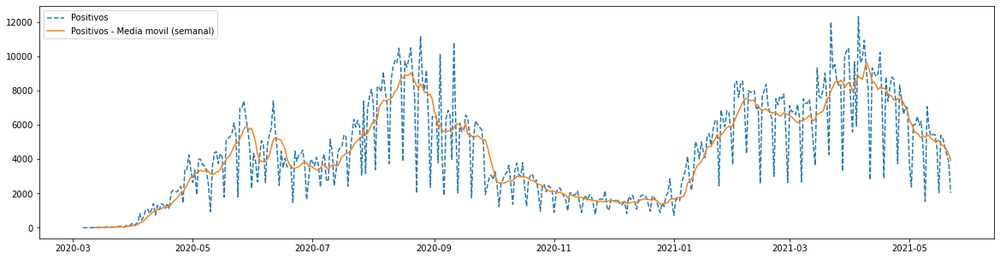

In [28]:
## Evolución de infectados
positivos['CUENTA'] = 1
posi_dia = positivos.groupby('FECHA', as_index = 0)['CUENTA'].sum()

ts = pd.Series(posi_dia.CUENTA.values, index = posi_dia.FECHA.values)
me_sem = ts.rolling(window = 7).mean()

plt.rcParams['figure.figsize'] = (20, 5)
plt.plot(posi_dia.FECHA, posi_dia.CUENTA, linestyle = 'dashed', label = 'Positivos')
plt.plot(me_sem, label = 'Positivos - Media movil (semanal)')

plt.legend()

plt.show()

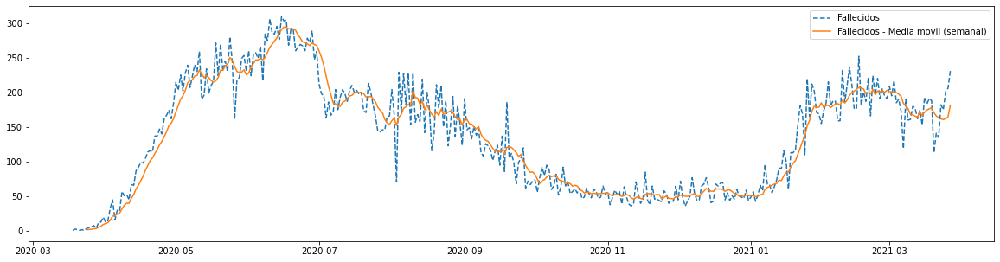

In [32]:
## Evolución de fallecidos

fallecidos = pd.read_csv("fallecidos_covid.csv", sep = ";", encoding = "latin")

fallecidos['FECHA'] = pd.to_datetime(fallecidos.FECHA_FALLECIMIENTO, format = '%Y%m%d', errors = 'coerce')

fallecidos['CUENTA'] = 1
fallecidos['GRUPO_EDAD'] = fallecidos.apply(lambda x : grupo_edad(x["EDAD_DECLARADA"]), axis = 1)

fall_dia = fallecidos.groupby('FECHA', as_index = 0)['CUENTA'].sum()
fall_dia

# La caída del último día (31 de mayo) es anómala y podría indicar un conteo incompleto, por lo que se obviará

fall_dia = fall_dia[:-1]

ts = pd.Series(fall_dia.CUENTA.values, index = fall_dia.FECHA.values)
me_sem = ts.rolling(window = 7).mean()

plt.rcParams['figure.figsize'] = (20, 5)
plt.plot(fall_dia.FECHA, fall_dia.CUENTA, linestyle = 'dashed', label = 'Fallecidos')
plt.plot(me_sem, label = 'Fallecidos - Media movil (semanal)')
plt.legend()
plt.show()

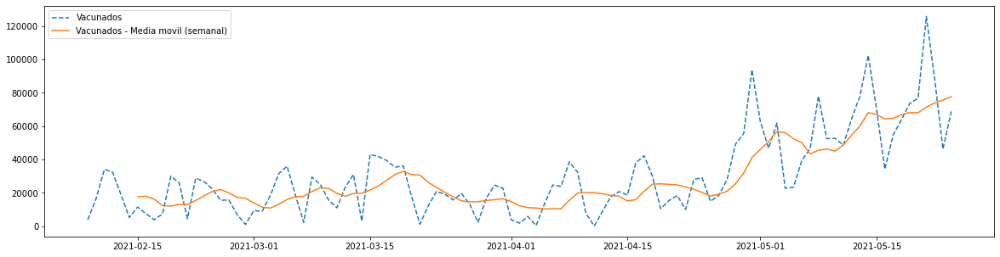

In [30]:
## Evolución de vacunados

vacunados['CUENTA'] = 1
vax_dia = vacunados.groupby('FECHA', as_index = 0)['CUENTA'].sum()
vax_dia

ts = pd.Series(vax_dia.CUENTA.values, index = vax_dia.FECHA.values)
me_sem = ts.rolling(window = 7).mean()

plt.rcParams['figure.figsize'] = (20, 5)
plt.plot(vax_dia.FECHA, vax_dia.CUENTA, linestyle = 'dashed', label = 'Vacunados')
plt.plot(me_sem, label = 'Vacunados - Media movil (semanal)')
plt.legend()
plt.show()

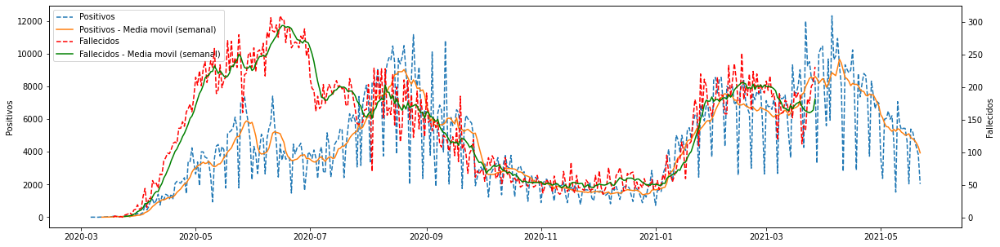

In [31]:
## Evolución de Infectados y fallecidos

fig, axs = plt.subplots()
ax2 = axs.twinx()

ts = pd.Series(posi_dia.CUENTA.values, index = posi_dia.FECHA.values)
me_sem = ts.rolling(window = 7).mean()

lns1 = axs.plot(posi_dia.FECHA, posi_dia.CUENTA, linestyle = 'dashed', label = 'Positivos')
lns2 = axs.plot(me_sem, label = 'Positivos - Media movil (semanal)')

ts = pd.Series(fall_dia.CUENTA.values, index = fall_dia.FECHA.values)
me_sem = ts.rolling(window = 7).mean()

lns3 = ax2.plot(fall_dia.FECHA, fall_dia.CUENTA, linestyle = 'dashed', c = 'red' , label = 'Fallecidos')
lns4 = ax2.plot(me_sem, c = 'green', label = 'Fallecidos - Media movil (semanal)')

lns = lns1 + lns2 + lns3 + lns4

labs = [l.get_label() for l in lns]

plt.rcParams['figure.figsize'] = (20, 5)
axs.legend(lns, labs)

axs.set_ylabel(r"Positivos")
ax2.set_ylabel(r"Fallecidos")


plt.show()